<a href="https://colab.research.google.com/github/17520299/DS102.L11.CNCL/blob/main/Detectron2-12/15-5%3A37.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# install dependencies: 
!pip install pyyaml==5.1
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
# opencv is pre-installed on colab

1.7.0+cu101 True
gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C) 2017 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



In [2]:
# install detectron2: (Colab has CUDA 10.1 + torch 1.7)
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
import torch
assert torch.__version__.startswith("1.7")
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.7/index.html
# exit(0)  # After installation, you need to "restart runtime" in Colab. This line can also restart runtime

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.7/index.html


In [3]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

** fvcore version of PathManager will be deprecated soon. **
** Please migrate to the version in iopath repo. **
https://github.com/facebookresearch/iopath 

** fvcore version of PathManager will be deprecated soon. **
** Please migrate to the version in iopath repo. **
https://github.com/facebookresearch/iopath 



In [4]:
!wget https://www.dropbox.com/s/vzr55y4lqx7te2b/Dataset.zip
!unzip Dataset.zip

--2020-12-15 06:38:09--  https://www.dropbox.com/s/vzr55y4lqx7te2b/Dataset.zip
Resolving www.dropbox.com (www.dropbox.com)... 162.125.1.18, 2620:100:6016:18::a27d:112
Connecting to www.dropbox.com (www.dropbox.com)|162.125.1.18|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/vzr55y4lqx7te2b/Dataset.zip [following]
--2020-12-15 06:38:09--  https://www.dropbox.com/s/raw/vzr55y4lqx7te2b/Dataset.zip
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc89f16c53538787727f5946f9f0.dl.dropboxusercontent.com/cd/0/inline/BFEb4L6jemCYyFOUoO6JoVdViCrtqKX7zVFhxYwewuse28Dz_sIs96ncttYoM4-madZLsf1QVfsOyv8xBCo5o4jVHHa3893M2TeApyE6uWtPmeHD73XjuWXRbNdvv2RwPM0/file# [following]
--2020-12-15 06:38:09--  https://uc89f16c53538787727f5946f9f0.dl.dropboxusercontent.com/cd/0/inline/BFEb4L6jemCYyFOUoO6JoVdViCrtqKX7zVFhxYwewuse28Dz_sIs96ncttYoM4-madZLsf1QVfsOyv8xBCo5o4jVHHa3893M2TeApyE6uWtPmeHD73

In [4]:
import json
from detectron2.structures import BoxMode
def get_traffic_dicts(imgdir):
  json_file = imgdir+'/data.json'
  with open(json_file) as f:
    dataset_dicts = json.load(f)
  for i in dataset_dicts:
    filename=i['file_name']
    i['file_name'] = imgdir+"/"+filename
    for j in i['annotations']:
      j['bbox_mode'] = BoxMode.XYWH_ABS
      j['category_id'] = int(j['category_id'])
  return dataset_dicts
from detectron2.data import DatasetCatalog, MetadataCatalog
for d in ['Train','Test']:
  DatasetCatalog.register('traffic_'+d,lambda d=d: get_traffic_dicts('/content/Dataset/'+d))
  MetadataCatalog.get('traffic_'+d).set(thing_classes=['pedestrian','car','van','bus','truck','motor','bicycle','tricycle','other'])
traffic_metadata = MetadataCatalog.get('traffic_Train')

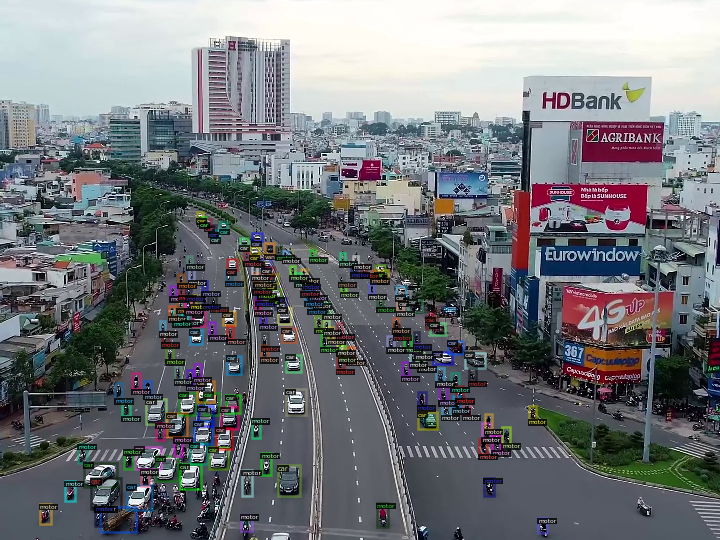

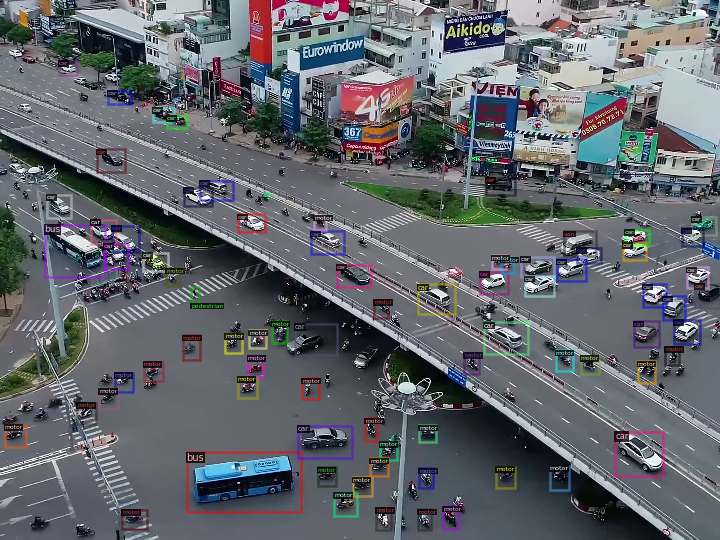

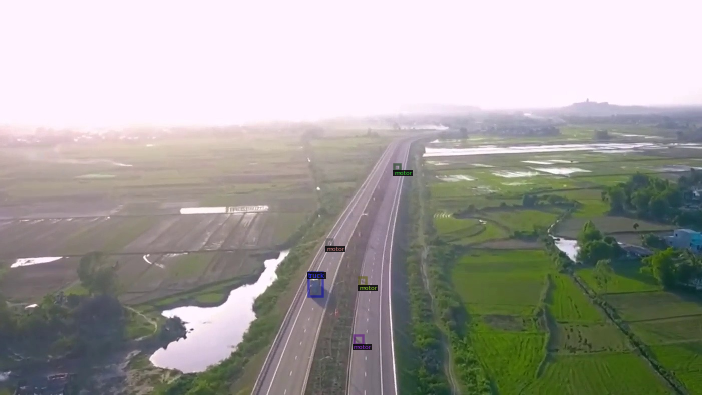

In [5]:
dataset_dicts = get_traffic_dicts('/content/Dataset/Train/')
for d in random.sample(dataset_dicts,3):
  img = cv2.imread(d['file_name'])
  visualizer = Visualizer(img[ :, :, ::-1], metadata=traffic_metadata,scale=0.5)
  vis = visualizer.draw_dataset_dict(d)
  cv2_imshow(vis.get_image()[:,:,::-1])

In [18]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
import os

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_C4_3x.yaml"))
cfg.DATASETS.TRAIN = ("traffic_Train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 8
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url('COCO-Detection/faster_rcnn_R_50_C4_3x.yaml')
cfg.SOLVER.IMS_PER_BATCH = 8
cfg.SOLVER.BASE_LR = 0.0125
cfg.SOLVER.MAX_ITER = 1500
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 256
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 9
cfg.TEST.EVAL_PERIOD = 500

os.makedirs(cfg.OUTPUT_DIR,exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[12/15 08:47:47 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv3): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
 

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 2048) in the checkpoint but (10, 2048) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (10,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 2048) in the checkpoint but (36, 2048) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (36,) in the model! You might want to double check if this is expected.


[12/15 08:47:48 d2.engine.train_loop]: Starting training from iteration 0
[12/15 08:49:13 d2.utils.events]:  eta: 1:43:10  iter: 19  total_loss: 2.828  loss_cls: 1.954  loss_box_reg: 0.3605  loss_rpn_cls: 0.2177  loss_rpn_loc: 0.2991  time: 4.1739  data_time: 0.1196  lr: 0.00024976  max_mem: 10805M
[12/15 08:50:35 d2.utils.events]:  eta: 1:41:10  iter: 39  total_loss: 1.551  loss_cls: 0.7355  loss_box_reg: 0.4139  loss_rpn_cls: 0.1239  loss_rpn_loc: 0.2504  time: 4.1497  data_time: 0.0495  lr: 0.00049951  max_mem: 10805M
[12/15 08:51:59 d2.utils.events]:  eta: 1:39:49  iter: 59  total_loss: 1.29  loss_cls: 0.5319  loss_box_reg: 0.4243  loss_rpn_cls: 0.08964  loss_rpn_loc: 0.2257  time: 4.1544  data_time: 0.0392  lr: 0.00074926  max_mem: 10805M
[12/15 08:53:22 d2.utils.events]:  eta: 1:38:29  iter: 79  total_loss: 1.372  loss_cls: 0.5345  loss_box_reg: 0.4709  loss_rpn_cls: 0.08737  loss_rpn_loc: 0.2723  time: 4.1608  data_time: 0.0380  lr: 0.00099901  max_mem: 10805M
[12/15 08:54:46 d2

In [19]:
%load_ext tensorboard
%tensorboard --logdir output

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 633), started 3:08:30 ago. (Use '!kill 633' to kill it.)

<IPython.core.display.Javascript object>

In [20]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

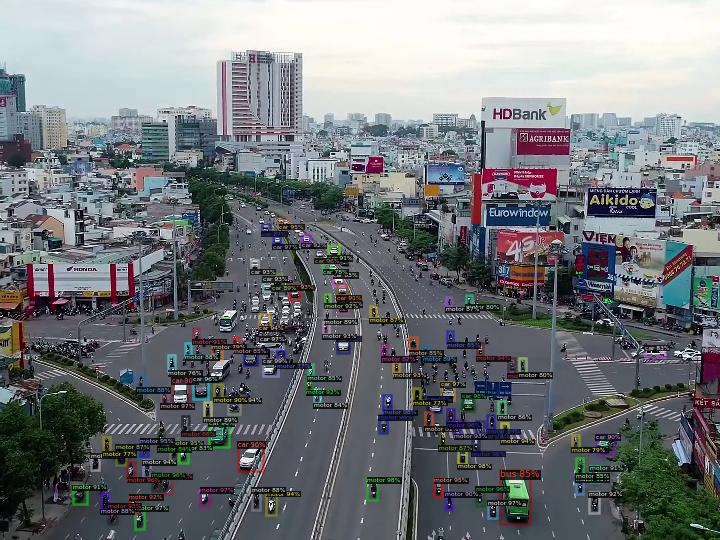

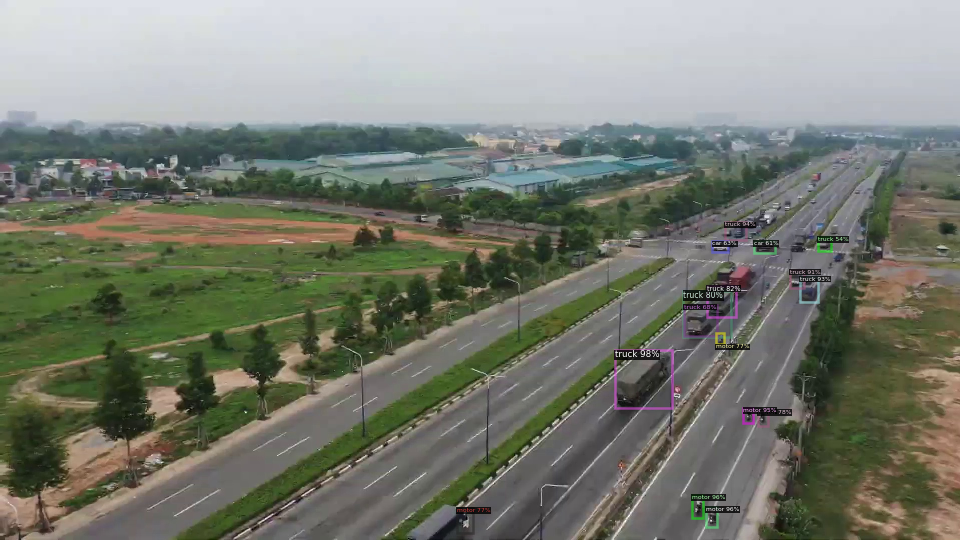

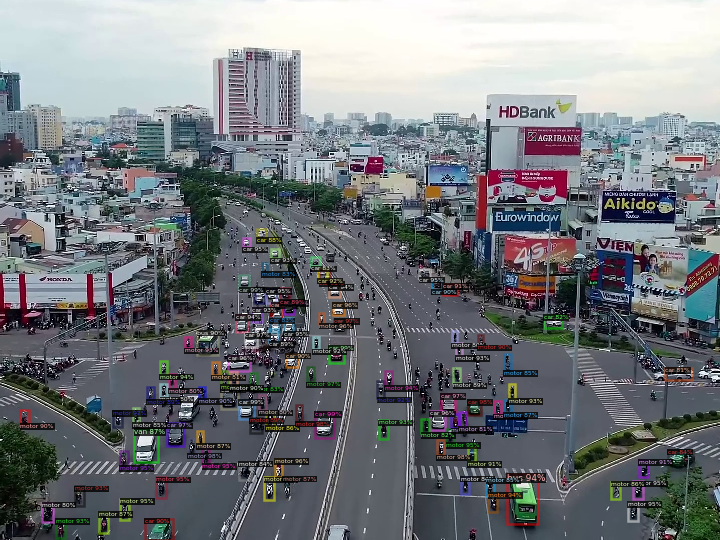

In [21]:
from detectron2.utils.visualizer import ColorMode
dataset_dicts = get_traffic_dicts("/content/Dataset/Test")
for d in random.sample(dataset_dicts, 3):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=traffic_metadata, 
                   scale=0.5, 
                   instance_mode=ColorMode.IMAGE   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

In [22]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("traffic_Test", cfg, False, output_dir="/output/")
test_loader = build_detection_test_loader(cfg, "traffic_Test")
inference_on_dataset(predictor.model, test_loader, evaluator)
# another equivalent way is to use trainer.test

WARNING [12/15 10:34:08 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass tasks in directly
[12/15 10:34:08 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[12/15 10:34:08 d2.data.common]: Serializing 327 elements to byte tensors and concatenating them all ...
[12/15 10:34:08 d2.data.common]: Serialized dataset takes 0.69 MiB
[12/15 10:34:08 d2.evaluation.evaluator]: Start inference on 327 images
[12/15 10:34:15 d2.evaluation.evaluator]: Inference done 11/327. 0.4627 s / img. ETA=0:02:26
[12/15 10:34:20 d2.evaluation.evaluator]: Inference done 22/327. 0.4634 s / img. ETA=0:02:21
[12/15 10:34:25 d2.evaluation.evaluator]: Inference done 33/327. 0.4658 s / img. ETA=0:02:17
[12/15 10:34:30 d2.evaluation.evaluator]: Inference done 44/327. 0.4709 s / img. ETA=0:02:13
[12/15 10:34:36 d2.evaluation.evaluator]: Infere

OrderedDict([('bbox',
              {'AP': 10.21495907361728,
               'AP-bicycle': 0.0,
               'AP-bus': 15.22900714360311,
               'AP-car': 22.583493110553775,
               'AP-motor': 16.50810986947339,
               'AP-other': 0.0,
               'AP-pedestrian': 0.0,
               'AP-tricycle': 7.1575759115865765,
               'AP-truck': 29.176769272606435,
               'AP-van': 1.2796763547322472,
               'AP50': 19.579175762084507,
               'AP75': 9.24162139887215,
               'APl': 35.86409565782113,
               'APm': 14.956963302775183,
               'APs': 5.1888951752190025})])